In [1]:
import pytesseract
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
image_file = "index_02.JPG"

In [3]:
img = Image.open(image_file)

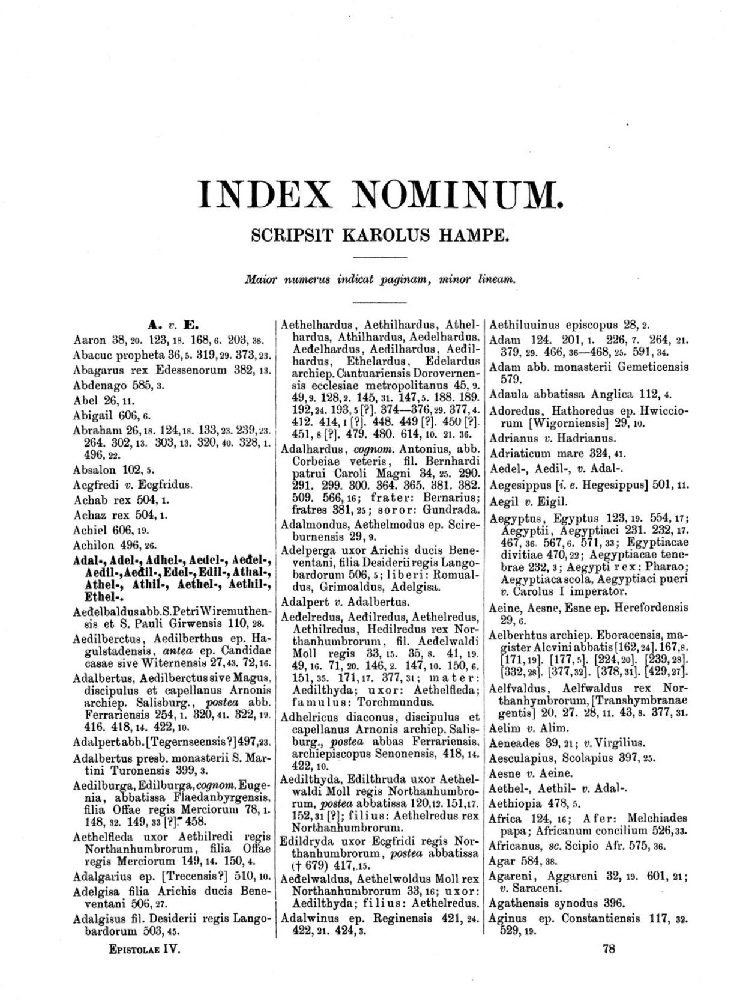

In [4]:
# Library to display the image
from IPython.display import display
display(img)

In [5]:
#Extract text from Image
ocr_result = pytesseract.image_to_string(img)

In [6]:
print(ocr_result)

INDEX NOMINUM.

SCRIPSIT KAROLUS HAMPE.

Maior numerus indicat paginam, minor lineam.

A.v. E.

Aaron 38, 20. 123, 18. 168, 6. 203, 38. |

Abacue propheta 36, 5. 319,29. 373, 23.
Abagarus rex Edessenorum 382, 13.
Abdenago 585, 3.

Abel 26, 11.

Abigail 606, 6.

Abraham 26,18. 124,18. 133, 23, 2:
264. 302, 13. 303, 13. 320, 40. 328, 1.
496, 22.

Absalon 102, 5.

Acgfredi v. Ecgfridus.

Achab rex 504, 1.

Achaz rex 504,1.

Achiel 606, 19.

Achilon 496, 26.

Adal-, Adel-, Adhel-, Aedel-, Aedel-,
‘Aedil-, Aed
Athel-, Athil-, Aethel-, Aethil-
Ethel-.

Aedelbaldusabb.S. Petri Wiremuthen-
sis et S. Pauli Girwensis 110, 28.

Aedilberctus, Aedilberthus ep. Ha-
gulstadensis, antea ep. Candidae
casae sive Witernensis 27,43. 72,16.

Adalbertus, Aedilberctus sive Magus,
discipulus et capellanus Arnonis
archiep. Salisburg., postea_abb.
Ferrariensis 254, 1. 320, 41. 322, 19.
416. 418, 14. 422, 10.

Adalpertabb. [Tegernseensis ?]497,2.

Adalbertus presb. monasterii 8. Mar-
tini Turonensis 399, 3.

Aed

In [7]:
# Import openCV library
import cv2

In [8]:
# Load the image using openCV library and create a copy of the image
image = cv2.imread("index_02.JPG")
base_image = image.copy()

In [9]:
# Create a gray image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [10]:
gray

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [11]:
gray.shape

(1664, 1243)

#### Function to display the image

In [12]:
#https://stackoverflow.com/questions/28816046/
# Displaying different images with actual size in matplotlib

def display_image_original_size(im_data):
    
    # dpi stands for "dots per inches", it is a measure of the resolution of the image
    # In this it will be used to calculate the size of the figure needed to display the image at its actual size
    dpi = 80 
    
    # Get the height as number of rows(Image height in numpy array) and width as number of columns(Image width in the numpy array)
    # SHape function will give a tupe with number of rows, column and image type(RGB or not) we need only first 2 values for our function
    height, width = im_data.shape[:2]
    
    # what size does the figure need to be in inches to fit the image
    figsize = width / float(dpi), height/float(dpi)
    
    # Create a figure of the right size with oneaxes  that takes up the full figure
    fig = plt.figure(figsize=figsize) # Create new matplotlib figur with the specified size
    # Denotes the axes which the figure entirely occupy here, it startes from bottom-left corner(0,0) and goes upto top-right corner(1.1)
    ax = fig.add_axes([0,0,1,1])
    
    # Hide spines, ticks, etc.
    #This line removes the axis lines, ticks, and labels from the plot, making the image the sole focus of the display
    ax.axis('off')
    
    # Display the image in grayscale
    ax.imshow(im_data, cmap = 'gray')
    
    plt.show()

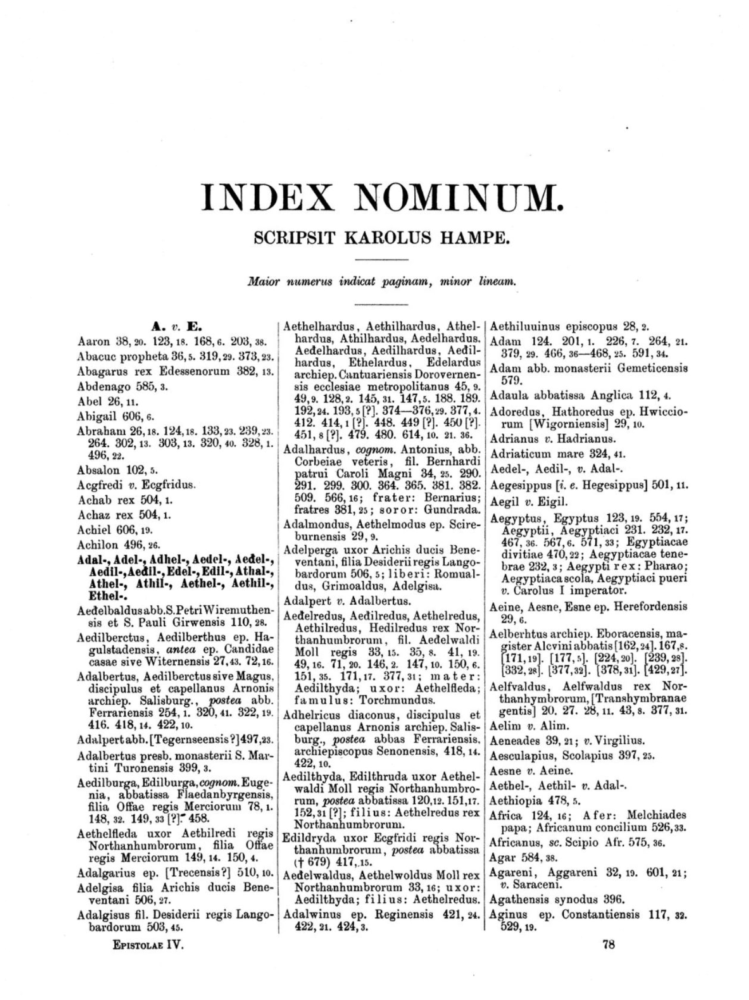

In [13]:
display_image_original_size(gray)

In [14]:
# Blur the image
blur = cv2.GaussianBlur(gray, (7,7), 0)

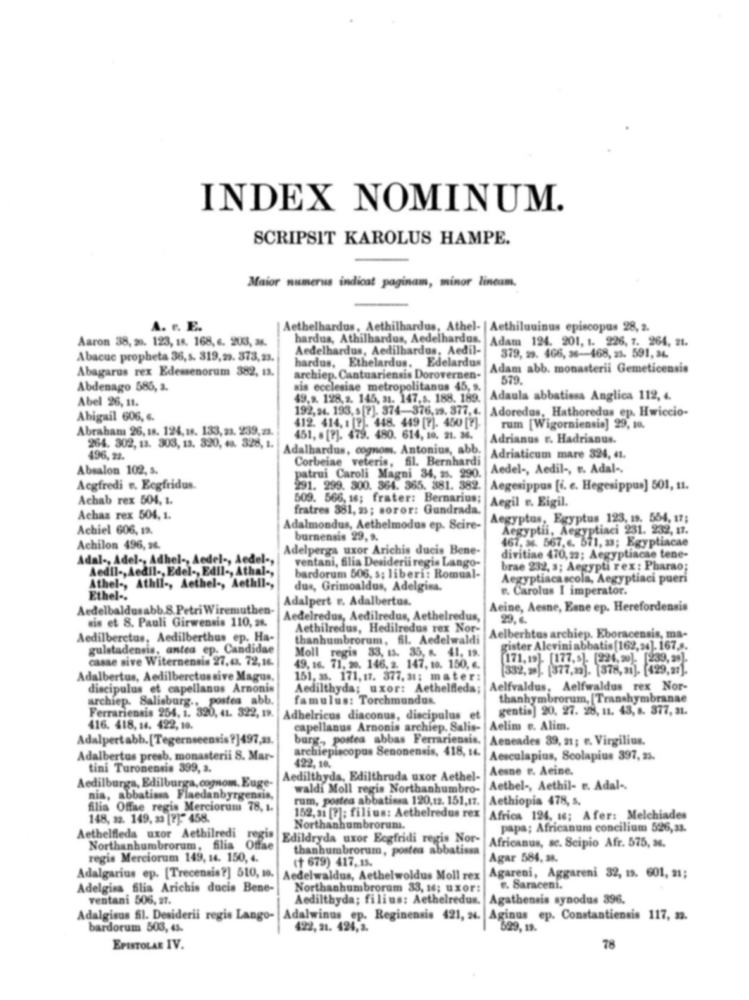

In [15]:
display_image_original_size(blur)

In [16]:
# Convert to black and white image and invert the image
thresh = cv2.threshold(blur, 0,255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[-1]

In [17]:
thresh

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

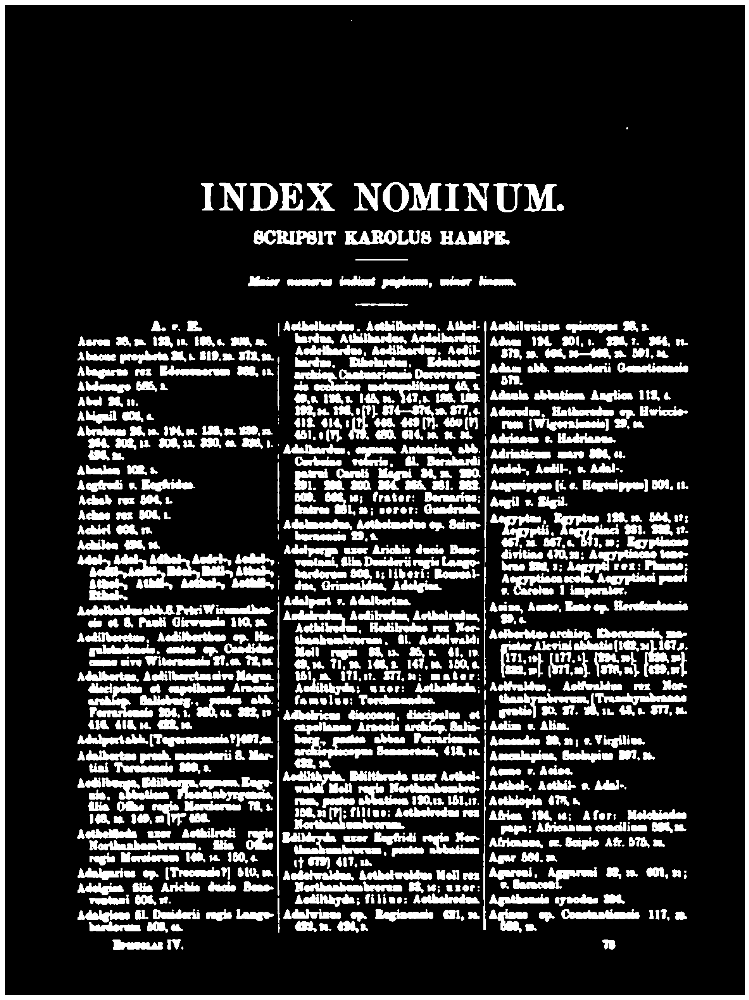

In [18]:
display_image_original_size(thresh)

In [19]:
# Create the kernal for dilation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,13))
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

In [20]:
# dilation
dilate = cv2.dilate(thresh, kernel, iterations = 1)

In [21]:
dilate

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

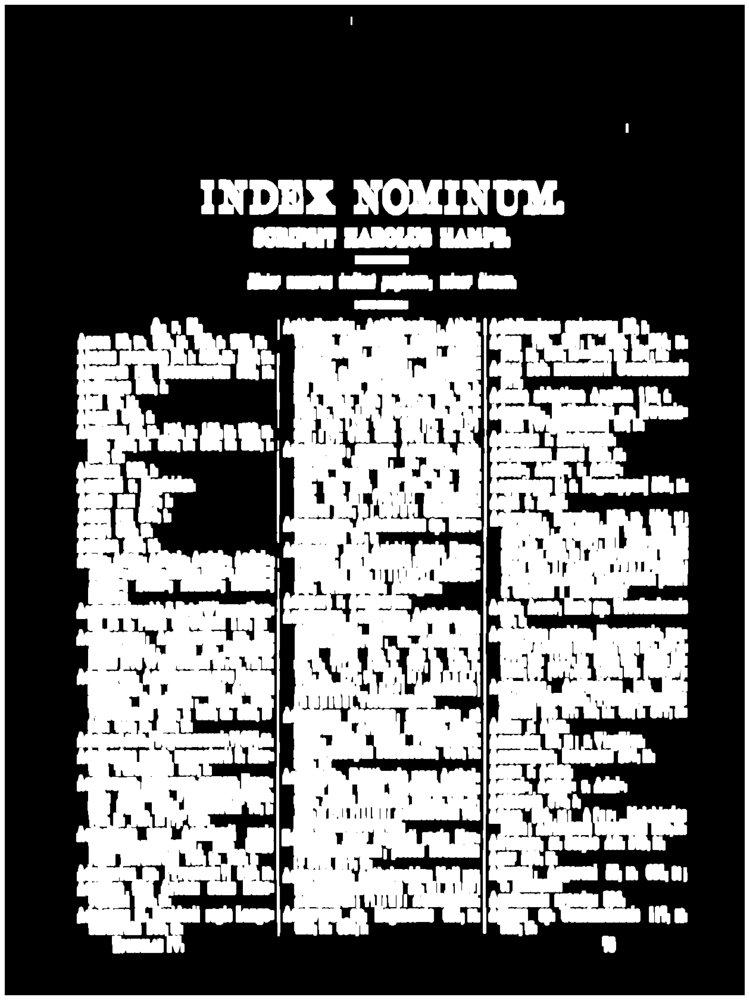

In [22]:
display_image_original_size(dilate)

In [23]:
# Create COntours
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts

((array([[[1005, 1564]],
  
         [[1003, 1566]],
  
         [[1003, 1580]],
  
         [[1004, 1581]],
  
         [[1005, 1581]],
  
         [[1006, 1582]],
  
         [[1006, 1590]],
  
         [[1008, 1592]],
  
         [[1010, 1592]],
  
         [[1011, 1591]],
  
         [[1012, 1591]],
  
         [[1012, 1590]],
  
         [[1013, 1589]],
  
         [[1015, 1591]],
  
         [[1016, 1591]],
  
         [[1017, 1592]],
  
         [[1022, 1592]],
  
         [[1023, 1591]],
  
         [[1024, 1591]],
  
         [[1024, 1590]],
  
         [[1025, 1589]],
  
         [[1025, 1588]],
  
         [[1026, 1587]],
  
         [[1026, 1574]],
  
         [[1025, 1573]],
  
         [[1025, 1567]],
  
         [[1023, 1565]],
  
         [[1016, 1565]],
  
         [[1015, 1566]],
  
         [[1013, 1564]]], dtype=int32),
  array([[[ 899, 1518]],
  
         [[ 897, 1520]],
  
         [[ 897, 1521]],
  
         [[ 896, 1522]],
  
         [[ 896, 1537]],
  
        

In [24]:
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

In [25]:
cnts = sorted(cnts, key = lambda x: cv2.boundingRect(x)[0])

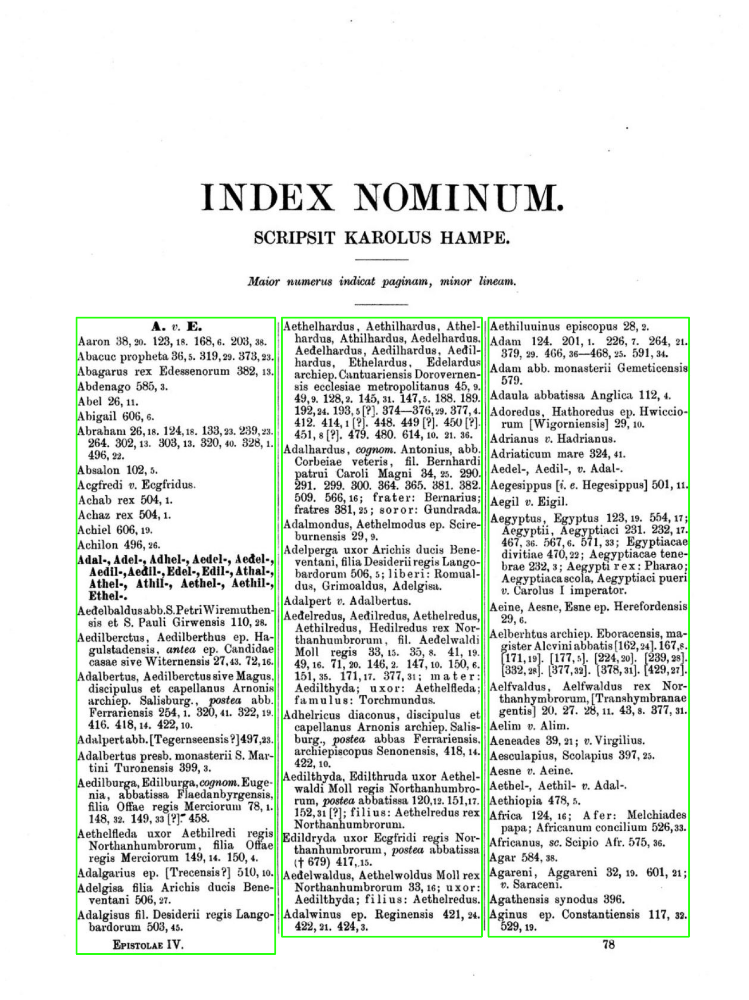

In [36]:
# draw contours of the columns on the Image
results = []

for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    if h > 200 and w> 20:
        roi = image[y: y+h, x:x+w] # Get each coloum
        
        # Create the bounding box on each column
        cv2.rectangle(image, (x,y), (x+w, y+h), (36, 255, 12), 2)
        
        # Get the text of each column
        ocr_result = pytesseract.image_to_string(roi) 
        ocr_result = ocr_result.split('\n') # SPlit it into list along the new line
        
        # Loop to append each col text to list
        for item in ocr_result: 
            
            results.append(item)
    
         
    
    
display_image_original_size(image)

In [37]:
print(results)

['A. v. E.', '', 'Aaron 38, 20. 123, 18. 168, 6. 203, 38.', 'Abacuc propheta 36,5. 319,29. 373, 23.', 'Abagarus rex Edessenorum 382, 13.', 'Abdenago 585, 3.', 'Abel 26, 11.', 'Abigail 606, 6.', 'Abraham 26,18, 124,18. 133, 23.', '264. 302, 13. 303, 13. 320, 40.', '496, 22.', 'Absalon 102, 5.', 'Acgfredi v. Ecgtridus.', 'Achab rex 504, 1.', 'Achaz rex 504, 1.', 'Achiel 606, 19.', 'Achilon 496, 26.', 'Adal-, Adel-, Adhel-, Aedel-, Aed', '', 'Aedil-, Aedil- Edel-, Edil-, Athal-,', 'Athel-, Athil-, Aethel-, Aethil-,', 'Ethel-.', 'Aedelbaldusabb.S. Petri Wiremuthen-', 'sis et S. Pauli Girwensis 110, 28.', 'Aedilberctus, Aedilberthus ep. Ha-', 'gulstadensis, antea ep. Candidae', 'casae sive Witernensis 27,43. 72,16.', 'Adalbertus, Aedilberctus sive Magus,', 'discipulus et capellanus Arnonis', 'archiep. Salisburg., postea_abb.', 'Ferrariensis 254, 1. 320, 41. 322, 19.', '416. 418, 14. 422, 10.', 'Adalpertabb.[Tegernseensis ?]497,23.', 'Adalbertus presb. monasterii S. Mar-', 'tini Turonensis 3

In [61]:
# Get the list items from the results
entities =[]
for item in results:
    item = item.strip().split(" ")[0]
    
    if len(item) > 2:
        
        # Getting all the items with 1st letter as letter A and '-' in the name
        if item[0] == "A" and '-' not in item:
            item = item.split(".")[0].replace(",","").replace(";","")
            entities.append(item)

In [62]:
entities

['Aaron',
 'Abacuc',
 'Abagarus',
 'Abdenago',
 'Abel',
 'Abigail',
 'Abraham',
 'Absalon',
 'Acgfredi',
 'Achab',
 'Achaz',
 'Achiel',
 'Achilon',
 'Aedelbaldusabb',
 'Aedilberctus',
 'Adalbertus',
 'Adalpertabb',
 'Adalbertus',
 'Aedilburga',
 'Aethelfleda',
 'Adalgarius',
 'Adelgisa',
 'Adalgisus',
 'Aethelhardus',
 'Aedelhardus',
 'Adalhardus',
 'Adalmondus',
 'Adelperga',
 'Adalpert',
 'Aedelredus',
 'Aethilredus',
 'Aedilthyda',
 'Adhelricus',
 'Aedilthyda',
 'Aedelwaldus',
 'Aedilthyda',
 'Adalwinus',
 'Aethiluuinus',
 'Adam',
 'Adam',
 'Adaula',
 'Adoredus',
 'Adrianus',
 'Adriaticum',
 'Aegesippus',
 'Aegil',
 'Aegyptus',
 'Aegyptii',
 'Aegyptiacascola',
 'Aeine',
 'Aelberhtus',
 'Aelfvaldus',
 'Aelim',
 'Aeneades',
 'Aesculapius',
 'Aesne',
 'Aethiopia',
 'Africa',
 'Africanus',
 'Agar',
 'Agareni',
 'Agathensis',
 'Aginus']

In [63]:
# Remove the duplicate items and convert it to list again
entities = list(set(entities))

In [65]:
# Sort the list
entities.sort()

In [66]:
entities

['Aaron',
 'Abacuc',
 'Abagarus',
 'Abdenago',
 'Abel',
 'Abigail',
 'Abraham',
 'Absalon',
 'Acgfredi',
 'Achab',
 'Achaz',
 'Achiel',
 'Achilon',
 'Adalbertus',
 'Adalgarius',
 'Adalgisus',
 'Adalhardus',
 'Adalmondus',
 'Adalpert',
 'Adalpertabb',
 'Adalwinus',
 'Adam',
 'Adaula',
 'Adelgisa',
 'Adelperga',
 'Adhelricus',
 'Adoredus',
 'Adrianus',
 'Adriaticum',
 'Aedelbaldusabb',
 'Aedelhardus',
 'Aedelredus',
 'Aedelwaldus',
 'Aedilberctus',
 'Aedilburga',
 'Aedilthyda',
 'Aegesippus',
 'Aegil',
 'Aegyptiacascola',
 'Aegyptii',
 'Aegyptus',
 'Aeine',
 'Aelberhtus',
 'Aelfvaldus',
 'Aelim',
 'Aeneades',
 'Aesculapius',
 'Aesne',
 'Aethelfleda',
 'Aethelhardus',
 'Aethilredus',
 'Aethiluuinus',
 'Aethiopia',
 'Africa',
 'Africanus',
 'Agar',
 'Agareni',
 'Agathensis',
 'Aginus']